In [1]:
from pathlib import Path

import pandas as pd
import numpy as np
import datetime as dt

import plotly.express as px
import plotly.io as pio
import matplotlib.pyplot as plt
import seaborn as sns

from ray import tune
from ray.air import session
from ray.train import Checkpoint

from recsys4daos.utils.notebooks import download_plotly, download_matplotlib
import paths

pio.templates.default = 'seaborn'
sns.set_theme()

In [2]:
SPLITS_FREQ = 'W-THU'
SPLITS_NORMALIZE = True # Wether or not to move everything to 00:00
CUTOFF_DATE = dt.datetime.fromisoformat("2023-07-29")
RAY_RESULTS_PATH = '~/ray_results3.11'
ORG_NAME = 'Decentraland'
LAST_FOLDS = 10 # Used for asserts
LAST_FOLD_DATE_STR: str = '2023-07-13'

OPTIM_METRIC = 'map@10'
OPTIM_MODE = 'max'

SAMPLES_PER_SPLIT: int = 100 # See 07_microsoft_tuning.ipynb

In [3]:
# Parameters
EXECUTION_ID = "2024-09-04T10:00"
ORG_NAME = "dOrg"
SPLITS_FREQ = "2d"
LAST_FOLDS = 10
SPLITS_NORMALIZE = True
LAST_FOLD_DATE_STR = "2022-02-18"


In [4]:
RAY_RESULTS_PATH = Path(RAY_RESULTS_PATH).expanduser()
assert RAY_RESULTS_PATH.is_dir()

## Get ray results

In [5]:
fname_glob = paths.lightgcn_ray_tune_fname(ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE, OPTIM_METRIC, fold='glob')
fname_glob

'dOrg/LightGCN_2d_normalize_map@10_fold=[0-9]*'

In [6]:
last_experiments = sorted(RAY_RESULTS_PATH.glob(fname_glob))
print(f"Found {len(last_experiments)} folds")

class TrainLightGCN:
    def __init__(self):
        raise NotImplementedError

tuners = [ tune.Tuner.restore(str(l), TrainLightGCN) for l in last_experiments ]
result_grids = [ tuner.get_results() for tuner in tuners ]
assert len(result_grids) == LAST_FOLDS, f"Waiting for full experiment to run {len(result_grids)}/{LAST_FOLDS}"

for i, rg in enumerate(result_grids):
    print(f"Fold: {i}, {rg.num_terminated} finished, {rg.num_errors} errors")
    assert rg.num_terminated == SAMPLES_PER_SPLIT
    assert rg.num_errors == 0, "There should be no errors"

Found 10 folds


Fold: 0, 100 finished, 0 errors
Fold: 1, 100 finished, 0 errors
Fold: 2, 100 finished, 0 errors
Fold: 3, 100 finished, 0 errors
Fold: 4, 100 finished, 0 errors
Fold: 5, 100 finished, 0 errors
Fold: 6, 100 finished, 0 errors
Fold: 7, 100 finished, 0 errors
Fold: 8, 100 finished, 0 errors
Fold: 9, 100 finished, 0 errors


In [7]:
# Checking data from just one experiment
pd.concat(result_grids[0]._experiment_analysis.trial_dataframes.values())

,real_batch_size,iteration,loss,mf_loss,emb_loss,model_recall,model_ndcg,model_precision,model_map,precision@1,...,node_ip,time_since_restore,iterations_since_restore,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,config/fold
0,28,5,0.133153,0.133071,0.000082,0.000000,0.000000,0.000000,0.000000,0.533333,...,147.96.81.131,0.362245,1,8,76,3,0.1571,5.432684e-07,30d,2022-01-31T00:00:00
1,28,10,0.001980,0.001868,0.000112,0.000000,0.000000,0.000000,0.000000,0.466667,...,147.96.81.131,0.548960,2,8,76,3,0.1571,5.432684e-07,30d,2022-01-31T00:00:00
2,28,15,0.002899,0.002759,0.000139,0.000000,0.000000,0.000000,0.000000,0.333333,...,147.96.81.131,0.727097,3,8,76,3,0.1571,5.432684e-07,30d,2022-01-31T00:00:00
3,28,20,0.000778,0.000609,0.000168,0.000000,0.000000,0.000000,0.000000,0.400000,...,147.96.81.131,0.907379,4,8,76,3,0.1571,5.432684e-07,30d,2022-01-31T00:00:00
4,28,25,0.000223,0.000010,0.000212,0.000000,0.000000,0.000000,0.000000,0.466667,...,147.96.81.131,1.086852,5,8,76,3,0.1571,5.432684e-07,30d,2022-01-31T00:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35,35,180,0.237114,0.208855,0.028259,0.000000,0.000000,0.000000,0.000000,0.466667,...,147.96.81.131,6.795657,36,8,2,4,0.1859,1.233015e-03,60d,2022-01-31T00:00:00
36,35,185,0.225958,0.197344,0.028614,0.000000,0.000000,0.000000,0.000000,0.466667,...,147.96.81.131,6.980723,37,8,2,4,0.1859,1.233015e-03,60d,2022-01-31T00:00:00
37,35,190,0.279303,0.248874,0.030430,0.033333,0.066667,0.066667,0.066667,0.466667,...,147.96.81.131,7.165225,38,8,2,4,0.1859,1.233015e-03,60d,2022-01-31T00:00:00
38,35,195,0.226167,0.195116,0.031051,0.100000,0.133333,0.133333,0.133333,0.466667,...,147.96.81.131,7.349036,39,8,2,4,0.1859,1.233015e-03,60d,2022-01-31T00:00:00


## Create dataframe with all results

In [8]:
# Read dataframe and drop some unneeded columns
# rdf = pd.concat([rg.get_dataframe(TARGET, 'max') for rg in result_grids ])
rdf = pd.concat([ pd.concat(rg._experiment_analysis.trial_dataframes.values()) for rg in result_grids ])

drop_cols = [
    'timestamp', 'node_ip', 'pid', 'hostname', 'time_since_restore', # 'checkpoint_dir_name', 'trial_id', # 'logdir'
    'model_recall', 'model_ndcg', 'model_precision', 'model_map', 
    'time_train', 'time_eval', 'time_total_s', 'time_this_iter_s',
    'training_iteration', 'iterations_since_restore',
    # 'recall@5', 'map@5', 'recall@10', 'map@10',
]
rdf = rdf.drop(columns=drop_cols)
rdf = rdf.drop(columns=['date']).rename(columns={'config/__trial_index__': 'config/fold', 'iteration':'config/iteration'})
rdf['config/fold'] = pd.to_datetime(rdf['config/fold'])
# rdf = rdf[rdf['done']]
print(rdf.columns)

for c in ['config/batch_size']: #, 'config/embedding_dim']:
    rdf[c] = 2**rdf[c]

# rdf[(rdf['config/fold'] >= 1) & (rdf['iteration'] > 10)].sort_values('precision@5').tail()
# Display some results
rdf.sort_values(OPTIM_METRIC).tail()

Index(['real_batch_size', 'config/iteration', 'loss', 'mf_loss', 'emb_loss',
       'precision@1', 'precision@3', 'precision@5', 'precision@10',
       'precision@15', 'precision@100', 'ndcg@1', 'ndcg@3', 'ndcg@5',
       'ndcg@10', 'ndcg@15', 'ndcg@100', 'map@1', 'map@3', 'map@5', 'map@10',
       'map@15', 'map@100', 'recall@1', 'recall@3', 'recall@5', 'recall@10',
       'recall@15', 'recall@100', 'r-precision@1', 'r-precision@3',
       'r-precision@5', 'r-precision@10', 'r-precision@15', 'r-precision@100',
       'time_rec', 'time_total_train', 'time_total_test', 'done', 'trial_id',
       'config/batch_size', 'config/embedding_dim', 'config/conv_layers',
       'config/learning_rate', 'config/l2', 'config/window_size',
       'config/fold'],
      dtype='object')


,real_batch_size,config/iteration,loss,mf_loss,emb_loss,precision@1,precision@3,precision@5,precision@10,precision@15,...,time_total_test,done,trial_id,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,config/fold
37,56,190,0.109146,0.105061,0.004085,1.0,0.333333,0.2,0.1,0.066667,...,4.837755,False,7c51dce1,1024,4,4,0.0012,3.104375e-04,10YE,2022-02-14
38,56,195,0.127167,0.123028,0.004140,1.0,0.333333,0.2,0.1,0.066667,...,4.965870,False,7c51dce1,1024,4,4,0.0012,3.104375e-04,10YE,2022-02-14
39,56,200,0.126263,0.122027,0.004235,1.0,0.333333,0.2,0.1,0.066667,...,5.092751,True,7c51dce1,1024,4,4,0.0012,3.104375e-04,10YE,2022-02-14
1,37,10,0.159045,0.159035,0.000010,1.0,0.333333,0.2,0.1,0.066667,...,0.250830,False,cc56f3b8,64,15,2,0.0140,8.974775e-07,60d,2022-02-14
28,56,145,0.350781,0.348374,0.002407,1.0,0.333333,0.2,0.1,0.066667,...,3.574077,False,ae50d36a,1024,1,2,0.7533,6.157402e-05,10YE,2022-02-14


### Define K_RECOMMENDATIONS

In [9]:
K_RECOMMENDATIONS = { int(c.split('@')[1]) for c in rdf.columns if '@' in c }
K_RECOMMENDATIONS

{1, 3, 5, 10, 15, 100}

## Assert that every experiment was completed

In [10]:
_config_cols = [ c for c in rdf.columns if c.startswith('config/') and c != 'config/iteration' ]

# _s = rdf.groupby(_config_cols).size().groupby('config/fold').size()
# print(_s)

# Cuidado, no es aleatorio sin reemplazamiento, por lo que
# alguna config, por casualidad, puede estar repetida y es necesario
# usar trial_id
_config_cols.append('trial_id')

_s = rdf.groupby(_config_cols).size().groupby('config/fold').size()
print(_s)
assert all(_s == SAMPLES_PER_SPLIT), "Insufficient number of samples" 

config/fold
2022-01-31    100
2022-02-02    100
2022-02-04    100
2022-02-06    100
2022-02-08    100
2022-02-10    100
2022-02-12    100
2022-02-14    100
2022-02-16    100
2022-02-18    100
dtype: int64


## Get total execution time

In [11]:
_config_cols = ['trial_id'] + [ c for c in rdf.columns if c.startswith('config/') and c != 'config/iteration' ]

last_iteration_time = rdf.groupby(_config_cols)['time_total_train'].max()
print(last_iteration_time)
print("Mean exec time: ", dt.timedelta(seconds=last_iteration_time.mean()))
print("Total exec time:", dt.timedelta(seconds=last_iteration_time.sum()))

trial_id  config/batch_size  config/embedding_dim  config/conv_layers  config/learning_rate  config/l2     config/window_size  config/fold
006c402d  64                 15                    1                   0.0048                1.111946e-05  10YE                2022-02-12     3.676894
011ebe47  128                74                    2                   0.1736                8.637994e-07  10YE                2022-02-08     3.351612
02d849d6  1024               15                    1                   0.0001                3.855053e-03  21d                 2022-02-08     0.938552
030245ba  1024               1                     1                   0.0029                6.990705e-04  21d                 2022-02-14     1.125807
03159561  64                 734                   1                   0.4981                5.028024e-04  30d                 2022-02-10     1.261257
                                                                                                          

In [12]:
# Number of iterations
rdf.groupby('trial_id')['config/iteration'].max().describe()

count    1000.0
mean      200.0
std         0.0
min       200.0
25%       200.0
50%       200.0
75%       200.0
max       200.0
Name: config/iteration, dtype: float64

## Get baseline data

In [13]:
bdf = paths.load_openpop(ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE)
bdf = bdf[bdf.index <= CUTOFF_DATE][-LAST_FOLDS:]
bdf.mean()

precision@1        0.338095
precision@3        0.184127
precision@5        0.110476
precision@10       0.055238
precision@15       0.036825
precision@100      0.005524
ndcg@1             0.338095
ndcg@3             0.373100
ndcg@5             0.373100
ndcg@10            0.373100
ndcg@15            0.373100
ndcg@100           0.373100
map@1              0.338095
map@3              0.363889
map@5              0.363889
map@10             0.363889
map@15             0.363889
map@100            0.363889
recall@1           0.276984
recall@3           0.400000
recall@5           0.400000
recall@10          0.400000
recall@15          0.400000
recall@100         0.400000
r-precision@1      0.311667
r-precision@3      0.400000
r-precision@5      0.400000
r-precision@10     0.400000
r-precision@15     0.400000
r-precision@100    0.400000
time_eval          0.092034
dtype: float64

In [14]:
bdf

,precision@1,precision@3,precision@5,precision@10,precision@15,precision@100,ndcg@1,ndcg@3,ndcg@5,ndcg@10,...,recall@10,recall@15,recall@100,r-precision@1,r-precision@3,r-precision@5,r-precision@10,r-precision@15,r-precision@100,time_eval
fold,,,,,,,,,,,,,,,,,,,,,
2023-06-13,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.071016
2023-06-15,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.072422
2023-06-17,0.714286,0.619048,0.371429,0.185714,0.123810,0.018571,0.714286,0.875847,0.875847,0.875847,...,1.0,1.0,1.0,0.533333,1.0,1.0,1.0,1.0,1.0,0.128050
2023-06-19,0.666667,0.555556,0.333333,0.166667,0.111111,0.016667,0.666667,0.855155,0.855155,0.855155,...,1.0,1.0,1.0,0.583333,1.0,1.0,1.0,1.0,1.0,0.125591
2023-06-21,1.000000,0.333333,0.200000,0.100000,0.066667,0.010000,1.000000,1.000000,1.000000,1.000000,...,1.0,1.0,1.0,1.000000,1.0,1.0,1.0,1.0,1.0,0.116004
2023-06-23,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.070117
2023-06-25,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.070288
2023-06-27,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.069970
2023-06-29,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.073378


(0.0, 1.0)

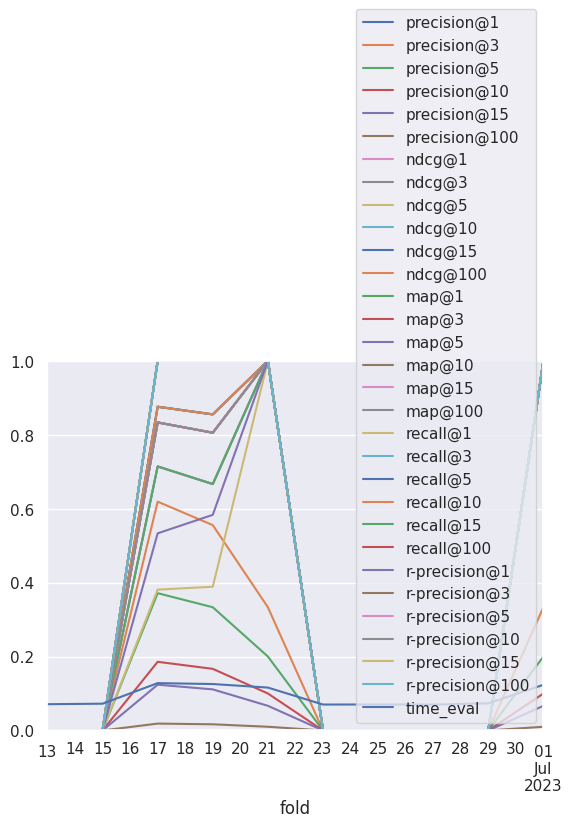

In [15]:
ax = bdf.plot()
ax.set_ylim(0, 1)

### Get perfect data

In [16]:
pdf = paths.load_perfect(ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE)
pdf = pdf[pdf.index <= CUTOFF_DATE][-LAST_FOLDS:]
pdf.mean()

precision@1        0.500000
precision@3        0.217460
precision@5        0.130476
precision@10       0.065238
precision@15       0.043492
precision@100      0.006524
ndcg@1             0.500000
ndcg@3             0.500000
ndcg@5             0.500000
ndcg@10            0.500000
ndcg@15            0.500000
ndcg@100           0.500000
map@1              0.500000
map@3              0.500000
map@5              0.500000
map@10             0.500000
map@15             0.500000
map@100            0.500000
recall@1           0.438889
recall@3           0.500000
recall@5           0.500000
recall@10          0.500000
recall@15          0.500000
recall@100         0.500000
r-precision@1      0.438889
r-precision@3      0.500000
r-precision@5      0.500000
r-precision@10     0.500000
r-precision@15     0.500000
r-precision@100    0.500000
time_eval          0.102190
dtype: float64

In [17]:
pdf

,precision@1,precision@3,precision@5,precision@10,precision@15,precision@100,ndcg@1,ndcg@3,ndcg@5,ndcg@10,...,recall@10,recall@15,recall@100,r-precision@1,r-precision@3,r-precision@5,r-precision@10,r-precision@15,r-precision@100,time_eval
fold,,,,,,,,,,,,,,,,,,,,,
2023-06-13,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.074633
2023-06-15,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.076881
2023-06-17,1.0,0.619048,0.371429,0.185714,0.123810,0.018571,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,0.666667,1.0,1.0,1.0,1.0,1.0,0.132476
2023-06-19,1.0,0.555556,0.333333,0.166667,0.111111,0.016667,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,0.722222,1.0,1.0,1.0,1.0,1.0,0.130821
2023-06-21,1.0,0.333333,0.200000,0.100000,0.066667,0.010000,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.000000,1.0,1.0,1.0,1.0,1.0,0.123268
2023-06-23,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.073590
2023-06-25,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.074251
2023-06-27,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.073739
2023-06-29,1.0,0.333333,0.200000,0.100000,0.066667,0.010000,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.000000,1.0,1.0,1.0,1.0,1.0,0.131873


(0.0, 1.0)

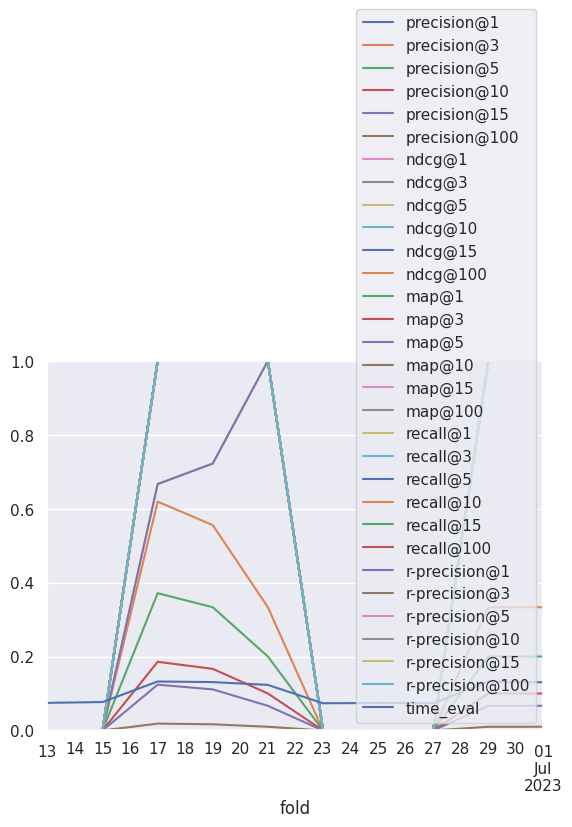

In [18]:
ax = pdf.plot()
ax.set_ylim(0, 1)

## Explore hparams

In [19]:
# Primero, obtenemos la mejor iteración, como si hubiesemos hecho early stopping
hdf = pd.concat(rg.get_dataframe(OPTIM_METRIC, OPTIM_MODE) for rg in result_grids)
print(hdf.columns)
hdf

Index(['real_batch_size', 'iteration', 'loss', 'mf_loss', 'emb_loss',
       'model_recall', 'model_ndcg', 'model_precision', 'model_map',
       'precision@1', 'precision@3', 'precision@5', 'precision@10',
       'precision@15', 'precision@100', 'ndcg@1', 'ndcg@3', 'ndcg@5',
       'ndcg@10', 'ndcg@15', 'ndcg@100', 'map@1', 'map@3', 'map@5', 'map@10',
       'map@15', 'map@100', 'recall@1', 'recall@3', 'recall@5', 'recall@10',
       'recall@15', 'recall@100', 'r-precision@1', 'r-precision@3',
       'r-precision@5', 'r-precision@10', 'r-precision@15', 'r-precision@100',
       'time_eval', 'time_train', 'time_rec', 'time_total_train',
       'time_total_test', 'done', 'training_iteration', 'trial_id', 'date',
       'timestamp', 'time_this_iter_s', 'time_total_s', 'pid', 'hostname',
       'node_ip', 'time_since_restore', 'iterations_since_restore',
       'config/batch_size', 'config/embedding_dim', 'config/conv_layers',
       'config/learning_rate', 'config/l2', 'config/window_siz

,real_batch_size,iteration,loss,mf_loss,emb_loss,model_recall,model_ndcg,model_precision,model_map,precision@1,...,time_since_restore,iterations_since_restore,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,config/fold,logdir
0,28,35,0.000465,0.000166,2.994037e-04,0.066667,0.066667,0.066667,0.066667,0.466667,...,1.430028,7,8,76,3,0.1571,5.432684e-07,30d,2022-01-31T00:00:00,8ace9af7
1,35,25,0.108149,0.106598,1.550321e-03,0.000000,0.000000,0.000000,0.000000,0.600000,...,1.129278,5,7,6,4,0.3535,9.005765e-06,60d,2022-01-31T00:00:00,4457fc80
2,55,145,0.411059,0.368177,4.288236e-02,0.000000,0.000000,0.000000,0.000000,0.866667,...,6.542956,29,7,1,3,0.9720,2.585192e-03,10YE,2022-01-31T00:00:00,6dbae657
3,25,5,0.454516,0.453069,1.446815e-03,0.166667,0.200000,0.200000,0.200000,0.533333,...,0.365143,1,7,695,2,0.0014,3.324255e-04,21d,2022-01-31T00:00:00,5d1562b1
4,28,5,0.280122,0.262722,1.740034e-02,0.166667,0.200000,0.200000,0.200000,0.466667,...,0.382596,1,8,4,4,0.1006,9.512855e-04,30d,2022-01-31T00:00:00,cd903108
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,33,5,0.374310,0.374072,2.382166e-04,0.500000,0.500000,0.500000,0.500000,1.000000,...,0.342185,1,10,1,3,0.1132,4.038761e-05,30d,2022-02-18T00:00:00,ff197f09
96,36,5,0.670383,0.670382,8.496373e-07,0.000000,0.000000,0.000000,0.000000,1.000000,...,0.365012,1,6,13,1,0.0003,1.097183e-06,60d,2022-02-18T00:00:00,e84cc2c2
97,36,5,0.538522,0.536138,2.383860e-03,0.500000,0.500000,0.500000,0.500000,0.500000,...,0.411870,1,10,8,1,0.0103,1.623798e-03,60d,2022-02-18T00:00:00,c8d2e0ec
98,36,55,0.260199,0.238146,2.205304e-02,0.500000,0.500000,0.500000,0.500000,1.000000,...,2.301962,11,10,3,1,0.0057,3.674998e-03,60d,2022-02-18T00:00:00,421ded16


In [20]:
# Force categorization
hdf['config/fold'] = hdf['config/fold'].astype(str)

fig = px.scatter(hdf, x='map@10', y='ndcg@10', color='config/fold')
fig.layout.update(showlegend=False)

download_plotly(fig, 'scatter_ndcg_map.pdf')
fig

In [21]:
fig = px.scatter(hdf, x='iteration', y='loss', color='config/fold', log_y=True)
fig.layout.update(showlegend=True)

download_plotly(fig, 'scatter_ndcg_map.pdf')
fig

In [22]:
fig = px.scatter(hdf, x='iteration', y=OPTIM_METRIC, color='config/fold', log_y=True)
fig.layout.update(showlegend=True)

download_plotly(fig, 'scatter_ndcg_map.pdf')
fig

In [23]:
fig = px.scatter(hdf, x='loss', y='ndcg@10', color='config/fold', log_x=True)
fig.layout.update(showlegend=True)

download_plotly(fig, 'scatter_ndcg_map.pdf')
fig

In [24]:
fig = px.scatter(hdf, x='real_batch_size', y='config/window_size', color='config/fold')
fig

In [25]:
fig = px.scatter(hdf, x=OPTIM_METRIC, y='precision@10', color='config/fold')
fig.layout.update(showlegend=False)

download_plotly(fig, 'scatter_map_precision.pdf')
fig

In [26]:
def plotly_scatter_config(config, log=True):
    config_cols = [c for c in hdf.columns if c.startswith('config/') ]
    return px.scatter(hdf, x=config, y=OPTIM_METRIC, color='config/fold', marginal_x='rug', marginal_y='rug', log_x=log, hover_data=config_cols)

plotly_scatter_config('config/embedding_dim')

In [27]:
plotly_scatter_config('config/window_size', log=False)

In [28]:
plotly_scatter_config('config/learning_rate')

In [29]:
plotly_scatter_config('config/l2')

In [30]:
plotly_scatter_config('config/batch_size', log=False)

In [31]:
plotly_scatter_config('config/conv_layers')

In [32]:
def clean_results(df: pd.DataFrame):
    hparams = [ c.removeprefix('config/') for c in df.columns if c.startswith('config/') and c not in ['config/iteration', 'config/fold'] ]
    return (
        df
        .rename(columns=lambda c: c.removeprefix('config/'),)
        .rename(columns={
            'time_total_train': 'time_train',
            'time_total_test': 'time_eval',
            'time_total_rec': 'time_rec',
        })
        .drop(columns=['real_batch_size'])
        .set_index(['fold', *hparams])
    ), hparams

clean_rdf, hparams = clean_results(rdf.copy())
clean_rdf

iteration  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size              
2022-01-31 256        76            3           0.1571        5.432684e-07 30d                  5   
                                                                           30d                 10   
                                                                           30d                 15   
                                                                           30d                 20   
                                                                           30d                 25   
...                                                                                           ...   
2022-02-18 1024       1             1           0.0011        1.120524e-03 60d                180   
                                                                           60d                185   
                                                                           60d                190   
                                                                           60d                195   
                                                                           60d                200   

                                                                                            loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size             
2022-01-31 256        76            3           0.1571        5.432684e-07 30d          0.133153   
                                                                           30d          0.001980   
                                                                           30d          0.002899   
                                                                           30d          0.000778   
                                                                           30d          0.000223   
...                                                                                          ...   
2022-02-18 1024       1             1           0.0011        1.120524e-03 60d          0.505222   
                                                                           60d          0.473838   
                                                                           60d          0.493297   
                                                                           60d          0.496754   
                                                                           60d          0.479918   

                                                                                         mf_loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size             
2022-01-31 256        76            3           0.1571        5.432684e-07 30d          0.133071   
                                                                           30d          0.001868   
                                                                           30d          0.002759   
                                                                           30d          0.000609   
                                                                           30d          0.000010   
...                                                                                          ...   
2022-02-18 1024       1             1           0.0011        1.120524e-03 60d          0.502788   
                                                                           60d          0.471337   
                                                                           60d          0.490856   
                                                                           60d          0.494158   
                                                                           60d          0.477352   

                                                                                        emb_loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2        

In [33]:
px.scatter(clean_rdf.reset_index(), y='iteration', x='loss', color='fold', log_x=True)

In [34]:
px.scatter(clean_rdf.reset_index(), x='loss', y=OPTIM_METRIC, color='fold', log_x=True)

Letting it run more iterations gets a best loss. But letting it run more does not get a best ndcg or map, as loss and the test results have not a strong correlation.

In [35]:
px.scatter(clean_rdf.reset_index(), y='iteration', x=OPTIM_METRIC, color='fold')

## Choosing best hparams

In [36]:
best_all = clean_rdf.sort_values(OPTIM_METRIC).drop_duplicates('trial_id', keep='last')
paths.save_model_results(best_all, 'lightgcn-all', ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE, K_RECOMMENDATIONS)
best_all

Saved dataframe into /home/daviddavo/recsys4daos/data/output/dOrg/models/lightgcn-all_2d_normalize.parquet


iteration  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size              
2022-02-02 512        93            3           0.0062        6.980178e-05 30d                 45   
                      1             2           0.0003        1.597958e-05 30d                150   
                                    3           0.0006        7.944287e-07 30d                 10   
           1024       1             1           0.0002        1.508436e-05 30d                170   
           128        2             2           0.0113        2.657324e-05 21d                 20   
...                                                                                           ...   
2022-02-14 1024       4             4           0.0003        1.241710e-03 10YE               200   
           256        10            2           0.4876        4.784859e-07 60d                130   
           1024       4             4           0.0012        3.104375e-04 10YE               200   
           64         15            2           0.0140        8.974775e-07 60d                 10   
           1024       1             2           0.7533        6.157402e-05 10YE               145   

                                                                                            loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size             
2022-02-02 512        93            3           0.0062        6.980178e-05 30d          0.028658   
                      1             2           0.0003        1.597958e-05 30d          0.674511   
                                    3           0.0006        7.944287e-07 30d          0.691590   
           1024       1             1           0.0002        1.508436e-05 30d          0.680028   
           128        2             2           0.0113        2.657324e-05 21d          0.445883   
...                                                                                          ...   
2022-02-14 1024       4             4           0.0003        1.241710e-03 10YE         0.298764   
           256        10            2           0.4876        4.784859e-07 60d          0.026350   
           1024       4             4           0.0012        3.104375e-04 10YE         0.126263   
           64         15            2           0.0140        8.974775e-07 60d          0.159045   
           1024       1             2           0.7533        6.157402e-05 10YE         0.350781   

                                                                                         mf_loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size             
2022-02-02 512        93            3           0.0062        6.980178e-05 30d          0.025885   
                      1             2           0.0003        1.597958e-05 30d          0.674507   
                                    3           0.0006        7.944287e-07 30d          0.691590   
           1024       1             1           0.0002        1.508436e-05 30d          0.680026   
           128        2             2           0.0113        2.657324e-05 21d          0.445821   
...                                                                                          ...   
2022-02-14 1024       4             4           0.0003        1.241710e-03 10YE         0.293744   
           256        10            2           0.4876        4.784859e-07 60d          0.025181   
           1024       4             4           0.0012        3.104375e-04 10YE         0.122027   
           64         15            2           0.0140        8.974775e-07 60d          0.159035   
           1024       1             2           0.7533        6.157402e-05 10YE         0.348374   

                                                                                            emb_loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2    

### Per fold

In [37]:
# We fix the total time in less than 250 so it has time to do the same number of iterations with the next fold
# best = rdf[rdf['time_total_train'] + rdf['time_total_test'] < 250].sort_values(OPTIM_METRIC).drop_duplicates('config/fold', keep='last').set_index('config/fold').sort_index()
idx = clean_rdf.index.names + ['iteration']
best = clean_rdf.sort_values(OPTIM_METRIC).reset_index().drop_duplicates('fold', keep='last').set_index(idx).sort_index()
paths.save_model_results(best, 'lightgcn-best-val', ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE, K_RECOMMENDATIONS)
best

Saved dataframe into /home/daviddavo/recsys4daos/data/output/dOrg/models/lightgcn-best-val_2d_normalize.parquet


,,,,,,,,loss,mf_loss,emb_loss,precision@1,precision@3,precision@5,precision@10,precision@15,precision@100,ndcg@1,...,r-precision@3,r-precision@5,r-precision@10,r-precision@15,r-precision@100,time_rec,time_train,time_eval,done,trial_id
fold,batch_size,embedding_dim,conv_layers,learning_rate,l2,window_size,iteration,,,,,,,,,,,,,,,,,,,,,
2022-01-31,64,1,4,0.7175,4.354244e-03,10YE,165,0.338644,2.843297e-01,0.054314,0.933333,0.400000,0.240000,0.120000,0.080000,0.012000,0.933333,...,0.964286,0.964286,0.964286,0.964286,0.964286,0.002101,2.749785,4.226751,False,0869af99
2022-02-02,512,5,2,0.0002,8.349791e-06,30d,190,0.631490,6.314826e-01,0.000008,1.000000,0.333333,0.200000,0.100000,0.066667,0.010000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.001839,1.563584,4.828634,False,9138fdf6
2022-02-04,64,85,1,0.2100,3.221043e-03,90d,175,0.065288,1.557073e-02,0.049718,1.000000,0.333333,0.200000,0.100000,0.066667,0.010000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.001106,1.733380,4.517603,False,b61cf872
2022-02-06,64,195,4,0.1346,2.897241e-05,90d,150,0.083716,1.088464e-09,0.083716,1.000000,0.428571,0.257143,0.128571,0.085714,0.012857,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.001296,1.504198,3.802756,False,8290d8cf
2022-02-08,128,74,2,0.1736,8.637994e-07,10YE,95,0.227434,2.248067e-01,0.002628,0.888889,0.444444,0.266667,0.133333,0.088889,0.013333,0.888889,...,0.944444,0.944444,0.944444,0.944444,0.944444,0.001356,1.633169,2.412508,False,011ebe47
2022-02-10,256,267,3,0.1315,6.308559e-05,60d,195,0.241530,4.105152e-22,0.241530,1.000000,0.400000,0.240000,0.120000,0.080000,0.012000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.001345,2.271696,4.948234,False,4d6631fd
2022-02-12,64,1,4,0.0315,1.708195e-05,10YE,95,0.226018,2.257312e-01,0.000287,1.000000,0.333333,0.200000,0.100000,0.066667,0.010000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.001997,1.710375,2.356385,False,a696b793
2022-02-14,1024,1,2,0.7533,6.157402e-05,10YE,145,0.350781,3.483742e-01,0.002407,1.000000,0.333333,0.200000,0.100000,0.066667,0.010000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.002372,2.455095,3.574077,False,ae50d36a
2022-02-16,256,100,1,0.0630,1.619815e-04,60d,5,0.015076,6.410689e-03,0.008665,1.000000,0.333333,0.200000,0.100000,0.066667,0.010000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.019268,0.206526,0.125684,False,123aa5ad


,precision@5,map@10
count,10.000000,10.000000
mean,0.220381,0.990926
std,0.027398,0.019135
min,0.200000,0.953704
25%,0.200000,1.000000
50%,0.200000,1.000000
75%,0.240000,1.000000
max,0.266667,1.000000


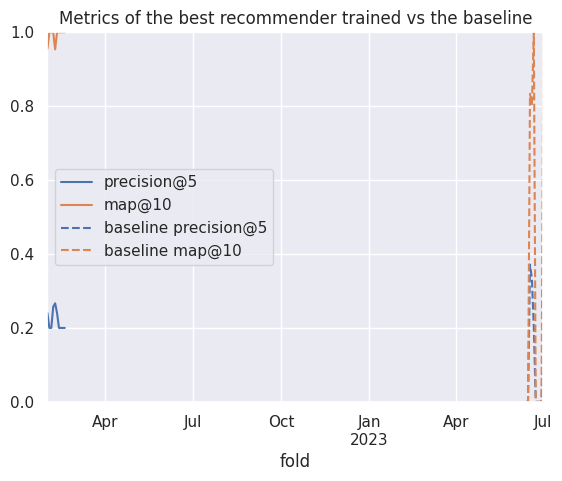

In [38]:
cols2plot = ['precision@5', 'map@10']

ax = best.reset_index().set_index('fold')[cols2plot].plot()
ax.set_ylim(0, 1)

bdf[cols2plot].rename(columns='baseline {}'.format).plot(ax=ax, style='--', color=[l.get_color() for l in ax.lines])

plt.title("Metrics of the best recommender trained vs the baseline")
best[cols2plot].describe()

In [39]:
best[['precision@5', 'ndcg@5', 'precision@10', 'ndcg@10', 'map@5', 'map@10']].mean()

precision@5     0.220381
ndcg@5          0.993598
precision@10    0.110190
ndcg@10         0.993598
map@5           0.990926
map@10          0.990926
dtype: float64

## Realisitc model (repeating hparams)

In [40]:
from pandas.api.types import is_float_dtype

config_cols = [ c for c in rdf.columns if c.startswith('config/') and c != 'config/iteration' ]
config_cols2 = config_cols + ['config/iteration']

all_configs = rdf.copy()
display(all_configs)
all_configs['config/fold'] = (pd.to_datetime(all_configs['config/fold']) + pd.tseries.frequencies.to_offset(SPLITS_FREQ)) # .astype(str)

# Leonardo Torres de Quevedo, perdoname por lo que voy a hacer
float_cols = [c for c in config_cols if is_float_dtype(all_configs[c].dtype) ]
all_configs[float_cols] = all_configs[float_cols].astype(str)
all_configs = all_configs.set_index(config_cols)
all_configs_index = all_configs.index

# all_configs_index = pd.MultiIndex.from_frame(all_configs[config_cols].astype(str))[:-1]

# No podemos utilizar los indices "tal cual" pues la coma flotante
# no encaja entre un fold y otro. Así que lo convierto a string
# y luego de nuevo a coma flotante.
# La otra solución sería usar np.isclose, pero habría que programar
# varias lineas y hacer nuestra propia función de búsqueda por cada
# columna o algo así
# O también, en lugar de str, multiplicar por 10^7 (el min. es 10**-7),
# pasar a entero, y luego dividir
aux = rdf.copy()
aux[float_cols] = aux[float_cols].astype(str)
aux = aux.set_index(config_cols)
print("Index intersection:", aux.index.intersection(all_configs_index))
all_realistic = aux.loc[aux.index.intersection(all_configs_index)]
# all_realistic.index = all_realistic.index.set_levels(
#     [ pd.to_numeric(l) for l in realistic.index.levels ]
# )
all_realistic

,real_batch_size,config/iteration,loss,mf_loss,emb_loss,precision@1,precision@3,precision@5,precision@10,precision@15,...,time_total_test,done,trial_id,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,config/fold
0,28,5,0.133153,0.133071,0.000082,0.533333,0.333333,0.24,0.12,0.080000,...,0.129063,False,8ace9af7,256,76,3,0.1571,5.432684e-07,30d,2022-01-31
1,28,10,0.001980,0.001868,0.000112,0.466667,0.311111,0.24,0.12,0.080000,...,0.260132,False,8ace9af7,256,76,3,0.1571,5.432684e-07,30d,2022-01-31
2,28,15,0.002899,0.002759,0.000139,0.333333,0.333333,0.24,0.12,0.080000,...,0.390025,False,8ace9af7,256,76,3,0.1571,5.432684e-07,30d,2022-01-31
3,28,20,0.000778,0.000609,0.000168,0.400000,0.333333,0.24,0.12,0.080000,...,0.516717,False,8ace9af7,256,76,3,0.1571,5.432684e-07,30d,2022-01-31
4,28,25,0.000223,0.000010,0.000212,0.466667,0.377778,0.24,0.12,0.080000,...,0.645349,False,8ace9af7,256,76,3,0.1571,5.432684e-07,30d,2022-01-31
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35,36,180,0.505222,0.502788,0.002434,0.500000,0.333333,0.20,0.10,0.066667,...,4.582046,False,53a7f8e4,1024,1,1,0.0011,1.120524e-03,60d,2022-02-18
36,36,185,0.473838,0.471337,0.002502,0.500000,0.333333,0.20,0.10,0.066667,...,4.709507,False,53a7f8e4,1024,1,1,0.0011,1.120524e-03,60d,2022-02-18
37,36,190,0.493297,0.490856,0.002441,0.500000,0.333333,0.20,0.10,0.066667,...,4.837394,False,53a7f8e4,1024,1,1,0.0011,1.120524e-03,60d,2022-02-18
38,36,195,0.496754,0.494158,0.002597,0.500000,0.333333,0.20,0.10,0.066667,...,4.964797,False,53a7f8e4,1024,1,1,0.0011,1.120524e-03,60d,2022-02-18


Index intersection: MultiIndex([( 512,   3, 2,                '0.0001', ...),
            ( 128,  34, 2,                '0.0091', ...),
            ( 128,  74, 2,                '0.1736', ...),
            ( 512,  86, 2, '0.0006000000000000001', ...),
            ( 512,  26, 2,                '0.6694', ...),
            ( 512,   7, 4,                '0.1593', ...),
            ( 256,   2, 4,   '0.17900000000000002', ...),
            ( 256,  96, 2,                '0.0784', ...),
            ( 256,  32, 4,  '0.015000000000000001', ...),
            (1024, 364, 2,                '0.0002', ...),
            ...
            (1024, 364, 2,                '0.0002', ...),
            (  64, 217, 2,   '0.47850000000000004', ...),
            ( 512,  86, 3,                '0.0002', ...),
            ( 512,  86, 2, '0.0006000000000000001', ...),
            (1024,   1, 1, '0.0029000000000000002', ...),
            ( 512, 665, 3,                '0.0092', ...),
            ( 256, 219, 4,          

real_batch_size  \
config/batch_size config/embedding_dim config/conv_layers config/learning_rate config/l2             config/window_size config/fold                    
512               3                    2                  0.0001               0.0015850583576508905 30d                2022-02-02                31   
                                                                                                                        2022-02-02                31   
                                                                                                                        2022-02-02                31   
                                                                                                                        2022-02-02                31   
                                                                                                                        2022-02-02                31   
...                                                                                                                                              ...   
1024              332                  3                  0.4863               0.0022115851672258576 10YE               2022-02-18                56   
                                                                                                                        2022-02-18                56   
                                                                                                                        2022-02-18                56   
                                                                                                                        2022-02-18                56   
                                                                                                                        2022-02-18                56   

                                                                                                                                     config/iteration  \
config/batch_size config/embedding_dim config/conv_layers config/learning_rate config/l2             config/window_size config/fold                     
512               3                    2                  0.0001               0.0015850583576508905 30d                2022-02-02                  5   
                                                                                                                        2022-02-02                 10   
                                                                                                                        2022-02-02                 15   
                                                                                                                        2022-02-02                 20   
                                                                                                                        2022-02-02                 25   
...                                                                                                                                               ...   
1024              332                  3                  0.4863               0.0022115851672258576 10YE               2022-02-18                180   
                                                                                                                        2022-02-18                185   
                                                                                                                        2022-02-18                190   
                                                                                                                        2022-02-18                195   
                                                                                                                        2022-02-18                200   

                                                                                                                                          loss  \
config/batch_size co

In [41]:
def bestByFold(df):
    idx = df[OPTIM_METRIC].idxmax()
    return df.loc[idx]

best_configs = (
    all_configs.loc[all_configs.index.intersection(all_realistic.index)]
    .reset_index()
    .groupby("config/fold")
    .apply(bestByFold)
    .set_index(config_cols)
    # .rename(columns="best_{}".format)
)
best_configs

/tmp/ipykernel_291175/543710717.py:9: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



real_batch_size  \
config/batch_size config/embedding_dim config/conv_layers config/learning_rate config/l2              config/window_size config/fold                    
256               2                    4                  0.17900000000000002  0.0011631657691358744  10YE               2022-02-02                55   
512               26                   2                  0.6694               1.4272116622201335e-06 30d                2022-02-04                31   
256               27                   2                  0.2056               3.060064883897499e-05  30d                2022-02-06                32   
128               580                  4                  0.44670000000000004  1.4287964892918515e-07 60d                2022-02-08                36   
                  74                   2                  0.1736               8.637993900055015e-07  10YE               2022-02-10                56   
512               7                    4                  0.1593               2.91903327474456e-06   21d                2022-02-12                31   
256               96                   2                  0.0784               4.9242449710696274e-05 21d                2022-02-14                31   
512               86                   3                  0.0002               0.00016674901474097163 30d                2022-02-16                31   
256               219                  4                  0.095                0.0002612310958370494  60d                2022-02-18                36   

                                                                                                                                      config/iteration  \
config/batch_size config/embedding_dim config/conv_layers config/learning_rate config/l2              config/window_size config/fold                     
256               2                    4                  0.17900000000000002  0.0011631657691358744  10YE               2022-02-02                180   
512               26                   2                  0.6694               1.4272116622201335e-06 30d                2022-02-04                 40   
256               27                   2                  0.2056               3.060064883897499e-05  30d                2022-02-06                 60   
128               580                  4                  0.44670000000000004  1.4287964892918515e-07 60d                2022-02-08                 80   
                  74                   2                  0.1736               8.637993900055015e-07  10YE               2022-02-10                 85   
512               7                    4                  0.1593               2.91903327474456e-06   21d                2022-02-12                 20   
256               96                   2                  0.0784               4.9242449710696274e-05 21d                2022-02-14                 10   
512               86                   3                  0.0002               0.00016674901474097163 30d                2022-02-16                  5   
256               219                  4                  0.095                0.0002612310958370494  60d                2022-02-18                 65   

                                                                                                                                          loss  \
config/batch_size config/embedding_dim config/conv_layers config/learning_rate config/l2              config/window_size config/fold             
256               2                    4                  0.17900000000000002  0.0011631657691358744  10YE               2022-02-02   0.194209   
512               26                   2                  0.6694               1.4272116622201335e-06 30d                2022-02-04   0.142614   
256               27                   2                  0.2056               3.060064883897499e-05  30d                2022-02-06   0.143961   
128               580    

In [42]:
best_realistic = all_realistic.join(best_configs.rename(columns="best_{}".format), how='right')

# Display the configs, to see that nothing is missing
display(best_realistic.groupby(best_realistic.index).size())

# First, do the "early stopping" (keep only the ones that are the same iterations or less)
best_realistic = best_realistic[best_realistic['config/iteration'] <= best_realistic['best_config/iteration']]
# Now, lets keep just the one with the best iteration
best_realistic = (
    best_realistic.sort_values('config/iteration')
    .groupby('config/fold')
    .tail(1)
    .sort_index()
    .reset_index()
    .set_index('config/fold')
    .sort_index()
)
best_realistic

(128, 74, 2, 0.1736, 8.637993900055015e-07, 10YE, 2022-02-10 00:00:00)                  40
(128, 580, 4, 0.44670000000000004, 1.4287964892918515e-07, 60d, 2022-02-08 00:00:00)    40
(256, 2, 4, 0.17900000000000002, 0.0011631657691358744, 10YE, 2022-02-02 00:00:00)      40
(256, 27, 2, 0.2056, 3.060064883897499e-05, 30d, 2022-02-06 00:00:00)                   40
(256, 96, 2, 0.0784, 4.9242449710696274e-05, 21d, 2022-02-14 00:00:00)                  40
(256, 219, 4, 0.095, 0.0002612310958370494, 60d, 2022-02-18 00:00:00)                   40
(512, 7, 4, 0.1593, 2.91903327474456e-06, 21d, 2022-02-12 00:00:00)                     40
(512, 26, 2, 0.6694, 1.4272116622201335e-06, 30d, 2022-02-04 00:00:00)                  40
(512, 86, 3, 0.0002, 0.00016674901474097163, 30d, 2022-02-16 00:00:00)                  40
dtype: int64

,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,real_batch_size,config/iteration,loss,mf_loss,...,best_r-precision@3,best_r-precision@5,best_r-precision@10,best_r-precision@15,best_r-precision@100,best_time_rec,best_time_total_train,best_time_total_test,best_done,best_trial_id
config/fold,,,,,,,,,,,,,,,,,,,,,
2022-02-02,256,2,4,0.17900000000000002,0.0011631657691358744,10YE,56,180,0.169505,1.426553e-01,...,0.928571,0.928571,0.928571,0.928571,0.928571,0.002595,3.025340,4.665541,False,e2b50955
2022-02-04,512,26,2,0.6694,1.4272116622201335e-06,30d,32,40,0.809633,8.044118e-01,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.001179,0.473249,1.013326,False,7b1b5c03
2022-02-06,256,27,2,0.2056,3.060064883897499e-05,30d,31,60,0.074213,6.224644e-02,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.001568,0.680616,1.513969,False,7a5abebd
2022-02-08,128,580,4,0.44670000000000004,1.4287964892918515e-07,60d,36,80,5.825261,5.813823e+00,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.001275,0.927221,2.060713,False,6d1f8c40
2022-02-10,128,74,2,0.1736,8.637993900055015e-07,10YE,56,85,0.002716,9.920386e-12,...,0.944444,0.944444,0.944444,0.944444,0.944444,0.001371,1.483407,2.159709,False,011ebe47
2022-02-12,512,7,4,0.1593,2.91903327474456e-06,21d,31,20,0.018716,1.852428e-02,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.001237,0.245936,0.497726,False,fb4f6ae6
2022-02-14,256,96,2,0.0784,4.9242449710696274e-05,21d,31,10,0.004088,1.923566e-04,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.001251,0.204756,0.253755,False,d6ab9972
2022-02-16,512,86,3,0.0002,0.00016674901474097163,30d,32,5,0.654210,6.537992e-01,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.019861,0.201084,0.124740,False,f0a255a0
2022-02-18,256,219,4,0.095,0.0002612310958370494,60d,36,65,0.026169,4.146277e-03,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.001433,0.815913,1.650723,False,c25208c5


In [43]:
paths.save_model_results(
    clean_results(best_realistic.reset_index().copy())[0],
    'lightgcn-best-test',
    ORG_NAME,
    SPLITS_FREQ,
    SPLITS_NORMALIZE,
    K_RECOMMENDATIONS,
)

Saved dataframe into /home/daviddavo/recsys4daos/data/output/dOrg/models/lightgcn-best-test_2d_normalize.parquet


,precision@5,map@10
count,9.000000,9.000000
mean,0.218201,0.811964
std,0.028125,0.121855
min,0.200000,0.666667
25%,0.200000,0.750000
50%,0.200000,0.785714
75%,0.240000,0.857143
max,0.266667,1.000000


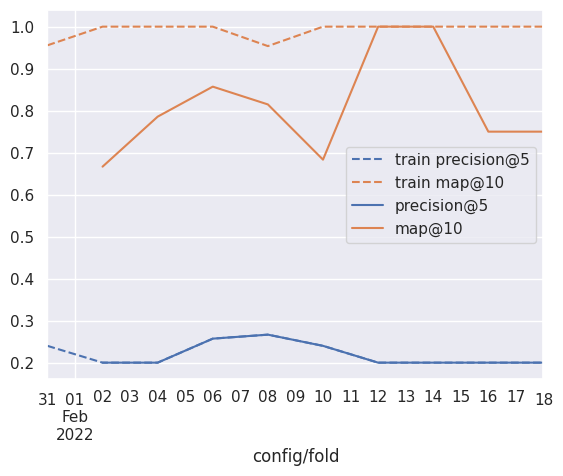

In [44]:
_toplot = best_realistic.copy().sort_index()
_toplot.index = pd.to_datetime(_toplot.index)

ax = best.reset_index().set_index('fold')[cols2plot].rename(columns='train {}'.format).plot(style='--', color=[l.get_color() for l in ax.lines])
# plt.xticks(range(10))
# bdf[cols2plot].rename(columns='baseline {}'.format).reset_index(drop=True).plot(ax=ax, style=':', color=[l.get_color() for l in ax.lines])

_toplot[cols2plot].plot(ax=ax)
# ax.set_ylim(0, 1)

_toplot[cols2plot].describe()

In [45]:
best_realistic.index.min()

Timestamp('2022-02-02 00:00:00')

In [46]:
bdf

,precision@1,precision@3,precision@5,precision@10,precision@15,precision@100,ndcg@1,ndcg@3,ndcg@5,ndcg@10,...,recall@10,recall@15,recall@100,r-precision@1,r-precision@3,r-precision@5,r-precision@10,r-precision@15,r-precision@100,time_eval
fold,,,,,,,,,,,,,,,,,,,,,
2023-06-13,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.071016
2023-06-15,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.072422
2023-06-17,0.714286,0.619048,0.371429,0.185714,0.123810,0.018571,0.714286,0.875847,0.875847,0.875847,...,1.0,1.0,1.0,0.533333,1.0,1.0,1.0,1.0,1.0,0.128050
2023-06-19,0.666667,0.555556,0.333333,0.166667,0.111111,0.016667,0.666667,0.855155,0.855155,0.855155,...,1.0,1.0,1.0,0.583333,1.0,1.0,1.0,1.0,1.0,0.125591
2023-06-21,1.000000,0.333333,0.200000,0.100000,0.066667,0.010000,1.000000,1.000000,1.000000,1.000000,...,1.0,1.0,1.0,1.000000,1.0,1.0,1.0,1.0,1.0,0.116004
2023-06-23,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.070117
2023-06-25,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.070288
2023-06-27,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.069970
2023-06-29,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.073378


In [47]:
_PERFECT_NAME = 'Ground Truth'
_LEAK_NAME = 'Leaky GNN'
CAT_ORDER = [_PERFECT_NAME, _LEAK_NAME, 'GNN', 'OpenPop']

def _get_toplot_table(metrics2plot=cols2plot, oracle=True, perfect=None, common_only=False):
    if perfect is None:
        perfect = metrics2plot
    
    # _toplot = best_realistic.copy()
    # _toplot.index = pd.to_numeric(_toplot.index)
    # _toplot['fold'] = _toplot.index

    _first_real_fold_idx = best_realistic.index.min()
    
    _toplot_real = best_realistic[metrics2plot].copy()
    _toplot_real['fold'] = pd.to_datetime(_toplot_real.index) # .astype(int)
    _toplot_real['rec'] = 'GNN'

    _toplot_base = bdf[metrics2plot].copy()
    # fold2str = _toplot_base.index.strftime('%G-W%V')
    # _toplot_base['fold'] = range(len(_toplot_base))
    _toplot_base['fold'] = pd.to_datetime(_toplot_base.index)
    _toplot_base['rec'] = 'OpenPop'

    # _colsbest = map("best_{}".format, _cols)
    if oracle:
        _toplot_best = best.reset_index().set_index('fold')[metrics2plot].copy() # [_colsbest].rename(columns=lambda x: x.split("_", 1)[-1])
        _toplot_best['fold'] = _toplot_best.index
        _toplot_best['rec'] = _LEAK_NAME
    else:
        _toplot_best = None
        _toplot_base = _toplot_base[_toplot_base['fold'] >= _first_real_fold_idx]
        _toplot_real = _toplot_real[_toplot_real['fold'] >= _first_real_fold_idx]

    if perfect:
        _toplot_perfect = pdf[perfect].copy()
        _toplot_perfect['fold'] = pd.to_datetime(_toplot_perfect.index)
        _toplot_perfect['rec'] = _PERFECT_NAME
        # Make same len as baseline
        # _toplot_perfect = _toplot_perfect.iloc[-len(_toplot_base):]
        _toplot_perfect = _toplot_perfect.loc[_toplot_base.index]
        assert _toplot_perfect.index.equals(_toplot_base.index)
    else:
        _toplot_perfect = None
        
    _toplot = (
        pd.concat((
            _toplot_real, 
            _toplot_best,
            _toplot_base,
            _toplot_perfect,
        ), ignore_index=True)
        .melt(id_vars=['fold', 'rec'], value_vars=metrics2plot, var_name='metric')
    )

    assert pd.api.types.is_datetime64_any_dtype(_toplot['fold'].dtype), "Fold column should be datetime"
    assert not (_toplot['fold'].isna()).any()
    
    _toplot['rec'] = pd.Categorical(_toplot['rec'], CAT_ORDER)
    _toplot['fold_week'] = _toplot['fold'].dt.strftime('%G-W%V') # fold2str[_toplot['fold']]

    return _toplot.sort_values('fold')

_tablecols = ['precision@5', 'precision@10', 'recall@5', 'recall@10', 'map@5', 'map@10', 'ndcg@5', 'ndcg@10']
_table = _get_toplot_table(_tablecols)
# Skip the first fold so everyone has 9 folds and metrics are consistent
_table = _table[_table['fold'] >= best_realistic.index.min()]
print(_table.groupby(['rec', 'metric'])['value'].mean().unstack(level=-1)[_tablecols].rename(
    index={
        'Perfect': 'Ground Truth',
        'realistic': 'GNN'
    }
).style.format(precision=2).to_latex())
_table.groupby(['rec', 'metric']).describe()

\begin{tabular}{lrrrrrrrr}
metric & precision@5 & precision@10 & recall@5 & recall@10 & map@5 & map@10 & ndcg@5 & ndcg@10 \\
rec &  &  &  &  &  &  &  &  \\
Ground Truth & 0.13 & 0.07 & 0.50 & 0.50 & 0.50 & 0.50 & 0.50 & 0.50 \\
Leaky GNN & 0.22 & 0.11 & 1.00 & 1.00 & 0.99 & 0.99 & 1.00 & 1.00 \\
GNN & 0.22 & 0.11 & 1.00 & 1.00 & 0.81 & 0.81 & 0.86 & 0.86 \\
OpenPop & 0.11 & 0.06 & 0.40 & 0.40 & 0.36 & 0.36 & 0.37 & 0.37 \\
\end{tabular}



/tmp/ipykernel_291175/3868849439.py:68: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/tmp/ipykernel_291175/3868849439.py:74: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



fold                                            \
                          count                 mean                  min   
rec          metric                                                         
Ground Truth map@10          10  2023-06-22 00:00:00  2023-06-13 00:00:00   
             map@5           10  2023-06-22 00:00:00  2023-06-13 00:00:00   
             ndcg@10         10  2023-06-22 00:00:00  2023-06-13 00:00:00   
             ndcg@5          10  2023-06-22 00:00:00  2023-06-13 00:00:00   
             precision@10    10  2023-06-22 00:00:00  2023-06-13 00:00:00   
             precision@5     10  2023-06-22 00:00:00  2023-06-13 00:00:00   
             recall@10       10  2023-06-22 00:00:00  2023-06-13 00:00:00   
             recall@5        10  2023-06-22 00:00:00  2023-06-13 00:00:00   
Leaky GNN    map@10           9  2022-02-10 00:00:00  2022-02-02 00:00:00   
             map@5            9  2022-02-10 00:00:00  2022-02-02 00:00:00   
             ndcg@10          9  2022-02-10 00:00:00  2022-02-02 00:00:00   
             ndcg@5           9  2022-02-10 00:00:00  2022-02-02 00:00:00   
             precision@10     9  2022-02-10 00:00:00  2022-02-02 00:00:00   
             precision@5      9  2022-02-10 00:00:00  2022-02-02 00:00:00   
             recall@10        9  2022-02-10 00:00:00  2022-02-02 00:00:00   
             recall@5         9  2022-02-10 00:00:00  2022-02-02 00:00:00   
GNN          map@10           9  2022-02-10 00:00:00  2022-02-02 00:00:00   
             map@5            9  2022-02-10 00:00:00  2022-02-02 00:00:00   
             ndcg@10          9  2022-02-10 00:00:00  2022-02-02 00:00:00   
             ndcg@5           9  2022-02-10 00:00:00  2022-02-02 00:00:00   
             precision@10     9  2022-02-10 00:00:00  2022-02-02 00:00:00   
             precision@5      9  2022-02-10 00:00:00  2022-02-02 00:00:00   
             recall@10        9  2022-02-10 00:00:00  2022-02-02 00:00:00   
             recall@5         9  2022-02-10 00:00:00  2022-02-02 00:00:00   
OpenPop      map@10          10  2023-06-22 00:00:00  2023-06-13 00:00:00   
             map@5           10  2023-06-22 00:00:00  2023-06-13 00:00:00   
             ndcg@10         10  2023-06-22 00:00:00  2023-06-13 00:00:00   
             ndcg@5          10  2023-06-22 00:00:00  2023-06-13 00:00:00   
             precision@10    10  2023-06-22 00:00:00  2023-06-13 00:00:00   
             precision@5     10  2023-06-22 00:00:00  2023-06-13 00:00:00   
             recall@10       10  2023-06-22 00:00:00  2023-06-13 00:00:00   
             recall@5        10  2023-06-22 00:00:00  2023-06-13 00:00:00   

                                                                     \
                                           25%                  50%   
rec          metric                                                   
Ground Truth map@10        2023-06-17 12:00:00  2023-06-22 00:00:00   
             map@5         2023-06-17 12:00:00  2023-06-22 00:00:00   
             ndcg@10       2023-06-17 12:00:00  2023-06-22 00:00:00   
             ndcg@5        2023-06-17 12:00:00  2023-06-22 00:00:00   
             precision@10  2023-06-17 12:00:00  2023-06-22 00:00:00   
             precision@5   2023-06-17 12:00:00  2023-06-22 00:00:00   
             recall@10     2023-06-17 12:00:00  2023-06-22 00:00:00   
             recall@5      2023-06-17 12:00:00  2023-06-22 00:00:00   
Leaky GNN    map@10        2022-02-06 00:00:00  2022-02-10 00:00:00   
             map@5         2022-02-06 00:00:00  2022-02-10 00:00:00   
             ndcg@10       2022-02-06 00:00:00  2022-02-10 00:00:00   
             ndcg@5        2022-02-06 00:00:00  2022-02-10 00:00:00   
             precision@10  2022-02-06 00:00:00  2022-02-10 00:00:00   
             precision@5   2022-02-06 00:00:00  2022-02-10 00:00:00   
             recall@10     2022-02-06 00:00:00  2022-02-10 00:00:00   
             recall@5      2022-02-06 00:00:00  2022-

/tmp/ipykernel_291175/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_291175/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



count      mean       std       min   25%       50%  \
rec          metric                                                             
Ground Truth map@10        10.0  0.500000  0.527046  0.000000  0.00  0.500000   
             precision@5   10.0  0.130476  0.148635  0.000000  0.00  0.100000   
Leaky GNN    map@10        10.0  0.990926  0.019135  0.953704  1.00  1.000000   
             precision@5   10.0  0.220381  0.027398  0.200000  0.20  0.200000   
GNN          map@10         9.0  0.811964  0.121855  0.666667  0.75  0.785714   
             precision@5    9.0  0.218201  0.028125  0.200000  0.20  0.200000   
OpenPop      map@10        10.0  0.363889  0.473663  0.000000  0.00  0.000000   
             precision@5   10.0  0.110476  0.151665  0.000000  0.00  0.000000   

                               75%       max  
rec          metric                           
Ground Truth map@10       1.000000  1.000000  
             precision@5  0.200000  0.371429  
Leaky GNN    map@10       1.000000  1.000000  
             precision@5  0.240000  0.266667  
GNN          map@10       0.857143  1.000000  
             precision@5  0.240000  0.266667  
OpenPop      map@10       0.826389  1.000000  
             precision@5  0.200000  0.371429

Cannot show ipywidgets in text

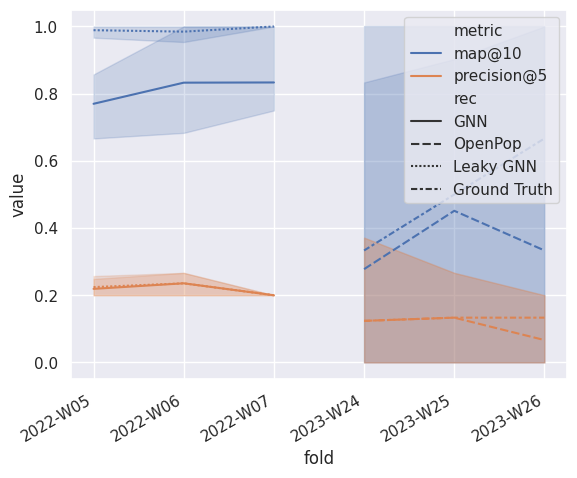

In [48]:
def plot_gnn_results(metrics2plot=cols2plot, oracle=False, perfect=None, common_only=False):
    _toplot = _get_toplot_table(metrics2plot, oracle, perfect)

    if common_only:
        _toplot = _toplot[_toplot['fold'] >= best_realistic.index.min()]

    ax = sns.lineplot(
        _toplot, x='fold_week', y='value', 
        hue='metric' if len(metrics2plot) > 1 else None, 
        style='rec',
        style_order=['GNN', 'OpenPop', _LEAK_NAME, _PERFECT_NAME],
    )
    ax.set_xlabel('fold')
    
    if len(metrics2plot) == 1:
        ax.set_ylabel(metrics2plot[0])
        ax.legend_.set_title(None)

    # ax.set_xticks(ax.get_xticks()[1:-1], _toplot_base.index.strftime('%G-W%V'), rotation=30, ha='right')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right')

    display(_toplot.groupby(['rec', 'metric'])['value'].describe())
    # print(_toplot.groupby(['rec', 'metric'])['value'].describe()[['mean', 'std', '50%', 'min', 'max']].to_html())

    return ax

ax = plot_gnn_results(oracle=True) # perfect=['precision@5'])
download_matplotlib(ax.figure, '09_gnn_results.pdf')

/tmp/ipykernel_291175/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_291175/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,precision@5,10.0,0.130476,0.148635,0.0,0.0,0.1,0.20,0.371429
GNN,precision@5,9.0,0.218201,0.028125,0.2,0.2,0.2,0.24,0.266667
OpenPop,precision@5,10.0,0.110476,0.151665,0.0,0.0,0.0,0.20,0.371429


Cannot show ipywidgets in text

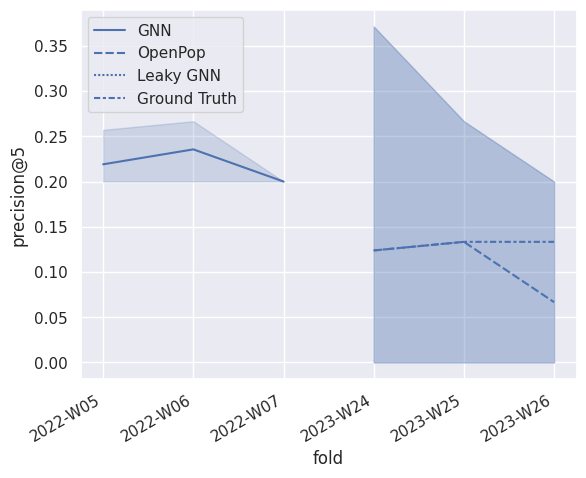

In [49]:
ax = plot_gnn_results(['precision@5'])
ax.figure.savefig('../figures/09_gnn_results_precision_5.png', bbox_inches='tight')
download_matplotlib(ax.figure, '09_gnn_results_precision_5.pdf')

/tmp/ipykernel_291175/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_291175/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,precision@5,10.0,0.130476,0.148635,0.0,0.0,0.1,0.20,0.371429
Leaky GNN,precision@5,9.0,0.218201,0.028125,0.2,0.2,0.2,0.24,0.266667
GNN,precision@5,9.0,0.218201,0.028125,0.2,0.2,0.2,0.24,0.266667
OpenPop,precision@5,10.0,0.110476,0.151665,0.0,0.0,0.0,0.20,0.371429


Cannot show ipywidgets in text

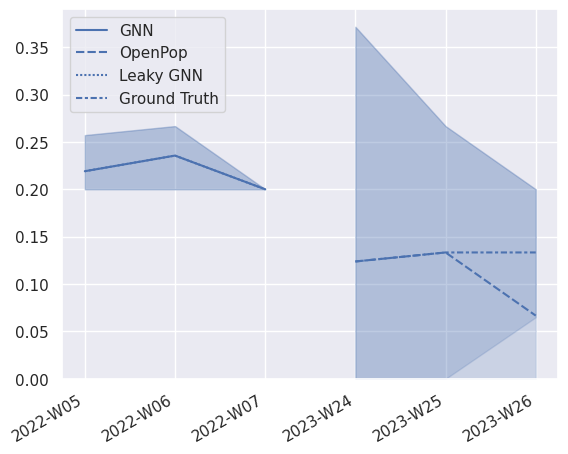

In [50]:
ax = plot_gnn_results(['precision@5'], oracle=True, common_only=True)

ax.set_xlabel('')
ax.set_ylabel('')
ax.set_ylim(0)

download_matplotlib(ax.figure, '09_gnn_results_precision_5_leaky.pdf')

/tmp/ipykernel_291175/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_291175/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,map@10,10.0,0.500000,0.527046,0.000000,0.00,0.500000,1.000000,1.0
GNN,map@10,9.0,0.811964,0.121855,0.666667,0.75,0.785714,0.857143,1.0
OpenPop,map@10,10.0,0.363889,0.473663,0.000000,0.00,0.000000,0.826389,1.0


Cannot show ipywidgets in text

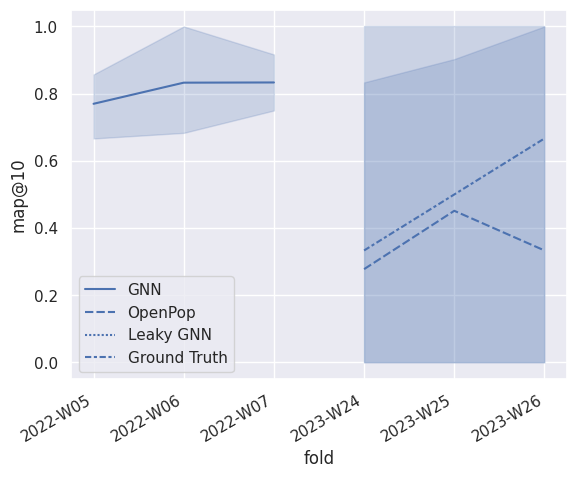

In [51]:
ax = plot_gnn_results(['map@10']) #, perfect=False)
ax.figure.savefig('../figures/09_gnn_results_map_10.png', bbox_inches='tight')
download_matplotlib(ax.figure, '09_gnn_results_map_10.pdf')

/tmp/ipykernel_291175/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_291175/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,ndcg@10,10.0,0.500000,0.527046,0.000000,0.000000,0.500000,1.000000,1.0
GNN,ndcg@10,9.0,0.860951,0.090128,0.753953,0.815465,0.841827,0.894551,1.0
OpenPop,ndcg@10,10.0,0.373100,0.483777,0.000000,0.000000,0.000000,0.870674,1.0


Cannot show ipywidgets in text

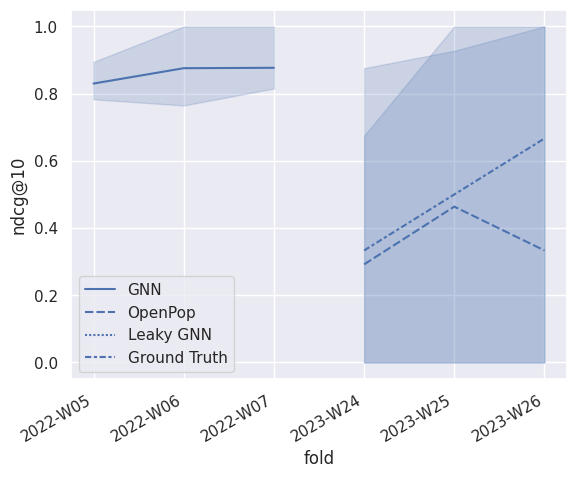

In [52]:
ax = plot_gnn_results(['ndcg@10']) #, perfect=False)
ax.figure.savefig('../figures/09_gnn_results_ndcg_10.png', bbox_inches='tight')
download_matplotlib(ax.figure, '09_gnn_results_ndcg_10.pdf')

/tmp/ipykernel_291175/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_291175/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,ndcg@10,10.0,0.500000,0.527046,0.000000,0.000000,0.500000,1.000000,1.0
Leaky GNN,ndcg@10,9.0,0.996215,0.011355,0.965936,1.000000,1.000000,1.000000,1.0
GNN,ndcg@10,9.0,0.860951,0.090128,0.753953,0.815465,0.841827,0.894551,1.0
OpenPop,ndcg@10,10.0,0.373100,0.483777,0.000000,0.000000,0.000000,0.870674,1.0


Cannot show ipywidgets in text

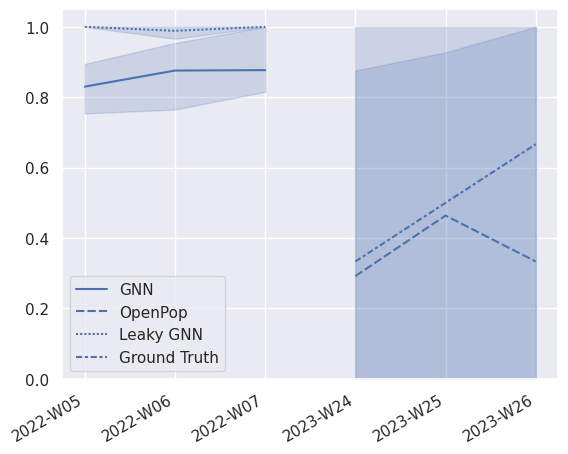

In [53]:
ax = plot_gnn_results(['ndcg@10'], oracle=True, common_only=True)

ax.set_xlabel('')
ax.set_ylabel('')
ax.set_ylim(0)

download_matplotlib(ax.figure, '09_gnn_results_ndcg_10_leaky.pdf')